# Сортировка пластиковых отходов

## Описание проекта

### Заказчик  
[Renue](https://renue.ru/) — IT-компания из Екатеринбурга, специализирующаяся на разработке высоконагруженных и отказоустойчивых решений для бизнеса и государственных организаций.

### Работу выполнил  
[Мельник Даниил](https://github.com/DanielNRU/)

---

### Описание  

#### Цель  
Разработать модель компьютерного зрения для детекции и классификации различных типов пластиковых отходов на изображениях, снятых с конвейерной ленты. Это решение автоматизирует процесс сортировки, повышая эффективность переработки и сокращая затраты на ручную работу.

#### Задачи  
1. Изучить предоставленный набор данных и подготовить его для обучения модели.  
2. Исследовать существующие решения для детекции объектов и выбрать подходящую модель.  
3. Обучить и протестировать модель, используя несколько подходов (включая предобученные модели).  
4. Провести анализ результатов и предложить возможные улучшения.  
5. Подготовить воспроизводимый код, подробную документацию и демонстрацию работы модели.

#### Формат проекта
Индивидуальное соревнование на платформе [Kaggle]('https://www.kaggle.com/competitions/waste-detection/leaderboard).  
**Основная метрика оценки** — **mean Average Precision (mAP)**, отражающая точность детекции объектов.  

Для оценки качества модели используется среднее взвешенное по классам (weighted mean by class support):  

Weighted mean$=\frac{\sum_{i=1}^{N} w_𝑖⋅𝑚𝐴𝑃_𝑖}{\sum_{i=1}^{N} w_𝑖}$

где:  
- $𝑚𝐴𝑃_i$ — значение каждого элемента,
- $w_i$ — вес (или поддержка) каждого элемента,
- $N$ — общее количество элементов.

---

### Данные  

**Описание набора данных**  
Заказчик предоставляет изображения отходов и их разметку.

**Файлы**  
- **images**: Папка с 9000 изображений. Каждое изображение — кадр с конвейера с отходами.  
- **train.csv**: Разметка для обучения модели. Поля:  
  - `file_name`: имя файла,  
  - `bbox`: рамка в формате [x_left, y_top, width, height],  
  - `category_id`: класс объекта.  
- **test.csv**: Файл с именами изображений для тестирования.  
- **sample_submission.csv**: Пример файла отправки решений. Поля:  
  - `file_name`: имя файла,  
  - `bbox`: список списков, формат каждого объекта: [class, confidence, x_left, y_top, width, height].

**Классы объектов**  
Набор включает 15 классов пластиковых отходов:  
1. PET (transparent) (green)  
2. PET (transparent) (brown)  
3. PET (transparent) (blue)  
4. PET (transparent)  
5. PET (transparent) (dark blue)  
6. PET (black)  
7. PET (white)  
8. PET (sticker)  
9. PET (flacon)  
10. PET (household chemicals)  
11. PND (household chemicals)  
12. PND packet  
13. Other plastic  
14. Other plastic (transparent)  
15. Not plastic  

**Формат изображений**  
- 9000 изображений в формате JPEG.  
- Размер изображения: 2048x1486 пикселей.  
- Камера над конвейерной лентой.  

---

### Технологический стек  
Python, NumPy, SciPy, PyTorch, OpenCV, Ultralytics  

---

### Импорт необходимых библиотек

In [ ]:
# Основные библиотеки
import os
import sys
import random
import ast
import shutil
from collections import defaultdict

# Работа с данными
import pandas as pd
import numpy as np

# Визуализация
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageDraw
from IPython.display import display

# Работа с изображениями
import cv2

# Машинное обучение и глубокое обучение
import tensorflow as tf
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split, StratifiedGroupKFold
from ultralytics import YOLO

# Аугментации
import albumentations as A
from albumentations import (
    ShiftScaleRotate,
    HorizontalFlip,
    VerticalFlip,
    RandomBrightnessContrast,
    Resize,
    RandomResizedCrop,
)
from albumentations.core.composition import OneOf

# Работа с файлами и конфигурациями
from shutil import copy
import yaml

from clearml import Task
from google.colab import userdata

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
RANDOM_STATE = 42
CL_NAMES = {
    0: "PET (transparent) (green)",
    1: "PET (transparent) (brown)",
    2: "PET (transparent) (blue)",
    3: "PET (transparent)",
    4: "PET (transparent) (dark blue)",
    5: "PET (black)",
    6: "PET (white)",
    7: "PET (sticker)",
    8: "PET (flacon)",
    9: "PET (household chemicals)",
    10: "PND (household chemicals)",
    11: "PND packet",
    12: "Other plastic",
    13: "Other plastic (transparent)",
    14: "Not plastic"
}
N_SPLITS = 5  # Количество фолдов

In [ ]:
user_secrets = UserSecretsClient()
ACCESS_KEY = userdata.get('CLEARML_API_ACCESS_KEY')
SECRET_KEY = user_secrets.get_secret("CLEARML_API_SECRET_KEY")

Проверим среду и назначим пути

In [ ]:
if 'COLAB_GPU' in os.environ:
    print("Код запущен в Google Colab")
    PATH = '/content/'
    PATH0 = PATH
    from google.colab import drive
    drive.mount('/content/drive')
    if not os.path.exists('images'):
        !unzip -q /content/drive/MyDrive/waste-detection.zip
elif 'KAGGLE_KERNEL_ID' in os.environ:
    print("Код запущен ва Kaggle")
    from kaggle_secrets import UserSecretsClient
    PATH0 = '/kaggle/input/waste-detection/'
    PATH = '/kaggle/working/'
else:
    print("Код запущен в другой среде")
    PATH = '/'

### Используемые функции

In [ ]:
def get_color_map(unique_categories):
    """
    Создает словарь соответствия category_id и цвета.

    Параметры:
        unique_categories (list): Список уникальных категорий.

    Возвращает:
        dict: Словарь {category_id: цвет}.
    """
    color_map = {}
    np.random.seed(42)  # Для воспроизводимости

    for category in unique_categories:
        color_map[category] = tuple(np.random.randint(0, 256, 3).tolist())  # RGB цвет

    return color_map

In [ ]:
def display_images(image_paths, annotations=None, grid_size=(3, 3), color_map=None, cli=-1):
    """
    Функция для отображения изображений с аннотациями bbox и выделением классов цветами.

    Параметры:
        image_paths (list): Список путей к изображениям.
        annotations (dict): Словарь с аннотациями в формате {image_name: [(class_id, bbox)]}.
                            bbox - список [x_min, y_min, x_max, y_max] или [x, y, w, h].
        grid_size (tuple): Размерность сетки (строки, столбцы).
        color_map (dict): Словарь соответствия {class_id: (R, G, B)}.
    """
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten()

    for i, image_path in enumerate(image_paths):
        if i >= rows * cols:
            break  # Ограничиваем количество отображаемых изображений

        ax = axes[i]

        # Проверяем существование изображения
        if not os.path.exists(image_path):
            ax.text(
                0.5, 0.5,
                "Изображение не найдено",
                color="red",
                ha="center",
                va="center"
            )
            ax.axis("off")
            continue

        # Загрузка изображения
        img = cv2.imread(image_path)
        if img is None:
            ax.text(
                0.5, 0.5,
                "Ошибка загрузки",
                color="red",
                ha="center",
                va="center"
            )
            ax.axis("off")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Извлечение имени изображения
        image_name = os.path.basename(image_path)
        annotation = annotations.get(image_name, []) if annotations else []

        # Наносим рамки bbox
        for class_id, bbox in annotation:
            color = color_map.get(class_id, (255, 255, 255))  # Цвет для класса
            if len(bbox) == 4:
                x_min, y_min, x_max, y_max = bbox
                cv2.rectangle(
                    img,
                    (int(x_min), int(y_min)),
                    (int(x_max), int(y_max)),
                    color,
                    2
                )

                # Извлекаем название класса из списка CL_NAMES
                class_name = CL_NAMES[class_id + cli] if class_id - 1 < len(CL_NAMES) else f"Class {class_id - 1}"

                # Добавляем текст (название класса) над рамкой
                cv2.putText(
                    img,
                    class_name,
                    (int(x_min), int(y_min) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1.5,
                    color,
                    2
                )

        # Отображение изображения
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(image_name)

    # Удаляем пустые графики
    for i in range(len(image_paths), rows * cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

In [ ]:
def safe_literal_eval(bbox_str):
    """
    Функция для преобразования колонки bbox из строкового формата в список
    """
    try:
        return ast.literal_eval(bbox_str)
    except (ValueError, SyntaxError):
        return None

In [ ]:
def prepare_yolo_format(data, images_folder, labels_folder, images_path):
    """
    Подготавливает данные в формате YOLO

    Аргументы:
        data (pd.DataFrame): Датафрейм с колонками file_name, bbox, category_id.
        images_folder (str): Путь к папке, куда перемещаются изображения.
        labels_folder (str): Путь к папке, куда записываются файлы разметки.
        images_path (str): Базовый путь к изображениям.

    Возвращает:
        None. Файлы сохраняются в указанных папках.
    """
    # Создание директорий, если их нет
    os.makedirs(images_folder, exist_ok=True)
    os.makedirs(labels_folder, exist_ok=True)

    def get_image_size(file_name):
        """
        Извлекает размеры изображения (ширина, высота).

        Аргументы:
            file_name (str): Имя файла изображения.

        Возвращает:
            tuple: Ширина и высота изображения.
        """
        with Image.open(os.path.join(images_path, file_name)) as img:
            return img.size

    # Обработка изображений и разметки
    for image_name in data['file_name'].unique():
        src_path = os.path.join(images_path, image_name)
        dest_path = os.path.join(images_folder, image_name)

        # Копирование изображения в папку
        shutil.copy(src_path, dest_path)

        # Подготовка пути для файла разметки
        label_path = os.path.join(
            labels_folder, f"{os.path.splitext(image_name)[0]}.txt"
        )

        # Фильтрация данных по текущему изображению
        image_data = data[data['file_name'] == image_name]

        # Получение размеров изображения
        width, height = get_image_size(image_name)

        annotations = []
        for _, row in image_data.iterrows():
            bbox = row['bbox']
            category_id = row['category_id']

            # Проверка корректности bbox и category_id
            if isinstance(bbox, list) and category_id > 0:
                x_min, y_min, box_width, box_height = bbox
                x_center = (x_min + box_width / 2) / width
                y_center = (y_min + box_height / 2) / height
                norm_width = box_width / width
                norm_height = box_height / height
                annotations.append(
                    f"{int(category_id) - 1} {x_center:.6f} {y_center:.6f} "
                    f"{norm_width:.6f} {norm_height:.6f}"
                )

        # Запись аннотаций в файл
        with open(label_path, 'w') as label_file:
            label_file.write("\n".join(annotations))

    print(
        f"Обработка данных завершена. Файлы сохранены в {images_folder} и {labels_folder}."
    )

In [ ]:
def yolo_to_annotations(labels_folder, images_folder, image_names):
    """
    Преобразует аннотации из YOLO-формата в формат [x_min, y_min, x_max, y_max].

    Параметры:
        labels_folder (str): Путь к папке с файлами аннотаций YOLO.
        images_folder (str): Путь к папке с изображениями.
        image_names (list): Список имён файлов изображений.

    Возвращает:
        dict: Словарь аннотаций {image_name: [(class_id, [x_min, y_min, x_max, y_max])]}.
    """
    annotations = {}
    for image_name in image_names:
        label_file = os.path.join(labels_folder, f"{os.path.splitext(image_name)[0]}.txt")
        image_path = os.path.join(images_folder, image_name)

        if not os.path.exists(label_file) or not os.path.exists(image_path):
            continue

        # Получаем размеры изображения
        with Image.open(image_path) as img:
            width, height = img.size

        with open(label_file, 'r') as file:
            bbox_data = file.readlines()

        bboxes = []
        for line in bbox_data:
            class_id, x_center, y_center, norm_width, norm_height = map(float, line.strip().split())
            x_center *= width
            y_center *= height
            bbox_width = norm_width * width
            bbox_height = norm_height * height
            x_min = x_center - bbox_width / 2
            y_min = y_center - bbox_height / 2
            x_max = x_center + bbox_width / 2
            y_max = y_center + bbox_height / 2
            bboxes.append((int(class_id), [x_min, y_min, x_max, y_max]))

        annotations[image_name] = bboxes

    return annotations

In [ ]:
def check_bbox(row, img_height, height_threshold=30):
    """
    Проверяет, является ли bounding box пустым, если он граничит с верхней или нижней границей изображения
    и его высота меньше заданного порогового значения.

    Параметры:
        row (pd.Series): Строка с данными, содержащая 'bbox' и 'file_name'.
        img_height (int): Высота изображения.
        height_threshold (int, optional): Пороговое значение высоты бокса.
                                          Бокс считается пустым, если его высота меньше этого значения.
                                          По умолчанию: 30.

    Возвращает:
        bool:
            - True, если бокс пустой (граничит с верхней/нижней границей и высота < height_threshold).
            - False в противном случае.
    """

    # Преобразуем строковое представление списка в реальные координаты
    bbox = row['bbox']
    # Проверка на None или пустое значение
    if bbox is None or not isinstance(bbox, (list, tuple)):
        return True
    try:
        # Преобразуем строковое представление списка в реальные координаты
        x_left, y_top, width, height = map(int, bbox)
    except (ValueError, TypeError):
        return True  # Если не удалось распарсить, считаем бокс "пустым"

    # Проверяем, что бокс граничит с верхней или нижней границей изображения
    if (y_top == 0 or y_top + height >= img_height) and height < height_threshold:
        return True

    return False

Проверим возможность подключения GPU

In [ ]:
# Проверяем доступность CUDA
if not torch.cuda.is_available():
    print("CUDA не доступна. Обучение будет выполняться на CPU.")
    device = 'cpu'
else:
    num_gpus = torch.cuda.device_count()  # Количество доступных GPU
    if num_gpus == 1:
        print("CUDA доступна! Обучение будет выполняться на одном GPU.")
        device = 'cuda:0'
    elif num_gpus > 1:
        print(f"CUDA доступна! Обучение будет выполняться на {num_gpus} GPU.")
        device = ','.join([f'cuda:{i}' for i in range(num_gpus)])
    else:
        print("Ошибка определения устройства.")
        device = 'cpu'

print(f"Используемое устройство: {device}")


CUDA доступна! Обучение будет выполняться на 2 GPU.
Используемое устройство: cuda:0,cuda:1


## Загрузка данных

Посмотрим содержание нашей папки

Считаем тренировочный и тестовый датасеты

In [ ]:
train_df = pd.read_csv(PATH0 + 'train.csv')
test_df = pd.read_csv(PATH0 + 'test.csv')

Проверим содержимое датасетов

In [ ]:
# Посмотрим первые несколько строк
train_df.head()

,file_name,bbox,category_id
0,000001.jpg,"[840.0, 0.0, 176.0, 124.0]",4.0
1,000001.jpg,"[612.0, 306.0, 383.0, 397.0]",2.0
2,000001.jpg,"[990.92, 551.0, 105.00000000000011, 186.0]",4.0
3,000002.jpg,"[1000.0, 614.0, 98.0, 178.0]",4.0
4,000002.jpg,"[605.0, 358.0, 402.0, 409.0]",2.0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32265 entries, 0 to 32264
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   file_name    32265 non-null  object 
 1   bbox         32148 non-null  object 
 2   category_id  32148 non-null  float64
dtypes: float64(1), object(2)
memory usage: 756.3+ KB


В датасете присутствуют пропущенные данные в bbox и  category_id

## Анализ данных

### Визуализируем пример изображений без разметки

Глянем несколько файлов, для которых пропущенны значения

In [ ]:
image_dir = PATH0 + 'images/'

In [ ]:
# Отбираем данные с пропущенными bbox или category_id
missing_data = train_df[
    train_df['bbox'].isnull() | train_df['category_id'].isnull()
]

In [ ]:
# Устанавливаем random_state
random.seed(RANDOM_STATE)
# Определяем пути к изображениям
image_paths = [
    os.path.join(image_dir, file_name)
    for file_name in random.sample(list(missing_data['file_name']), 9)  # Выбираем 9 случайных изображений
]

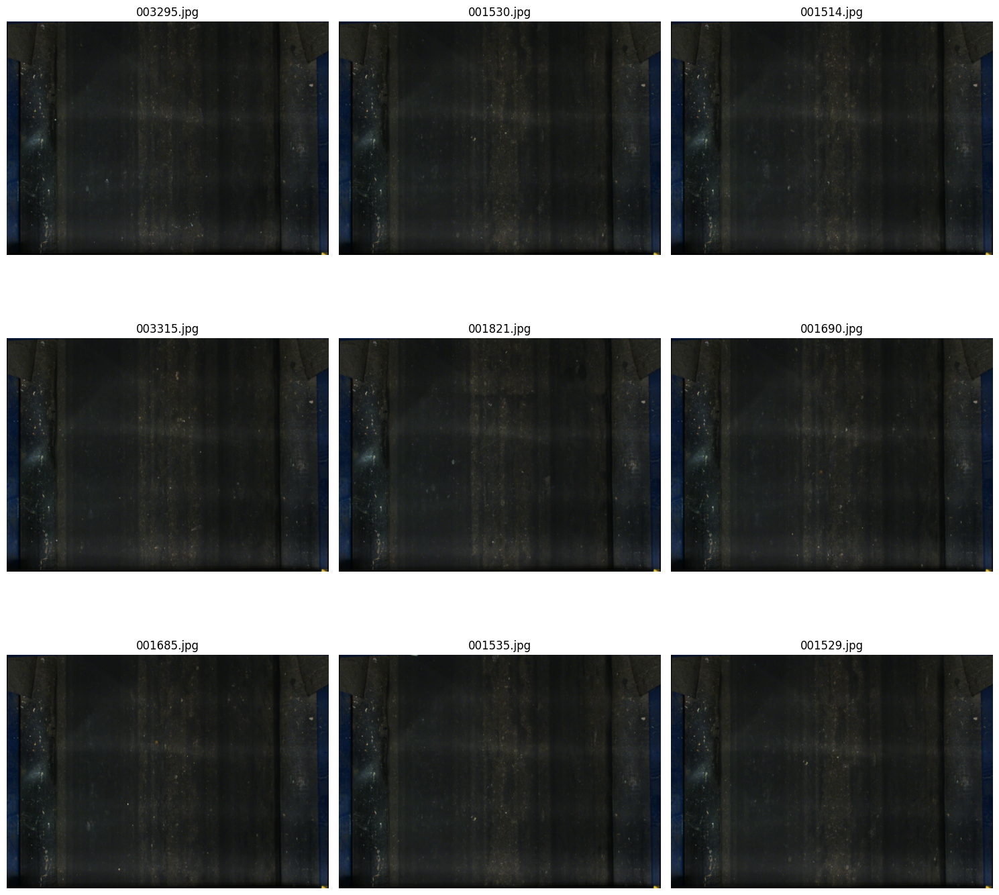

In [ ]:
# Визуализируем изображения
display_images(image_paths=image_paths)

На изображениях отсутствуют объекты для детекции

In [ ]:
test_df.head()

,file_name
0,000003.jpg
1,000006.jpg
2,000013.jpg
3,000016.jpg
4,000019.jpg


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2999 entries, 0 to 2998
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  2999 non-null   object
dtypes: object(1)
memory usage: 23.6+ KB


Преобразуем bbox в формат списка

In [ ]:
train_df['bbox'] = train_df['bbox'].apply(safe_literal_eval)

### Визуализируем пример изображений и разметки

Визуализируем пример изображений с разметкой

In [ ]:
# Извлекаем уникальные значения категорий (без NaN)
unique_categories = train_df['category_id'].dropna().unique()
# Генерируем цветовую карту для уникальных категорий
color_map = get_color_map(unique_categories)

In [ ]:
# Фильтруем строки с отсутствующими значениями в category_id
filtered_train_df = train_df.dropna(subset=['category_id'])

In [ ]:
# Извлекаем список уникальных имён файлов изображений
unique_images = filtered_train_df['file_name'].unique()

In [ ]:
# Формируем аннотации
annotations = {}
for _, row in filtered_train_df.iterrows():
    file_name = row['file_name']
    bbox = row['bbox']

    # Преобразуем [x, y, w, h] -> [x_min, y_min, x_max, y_max]
    bbox_converted = [
        bbox[0],
        bbox[1],
        bbox[0] + bbox[2],
        bbox[1] + bbox[3]
    ]
    category_id = row['category_id']

    if file_name not in annotations:
        annotations[file_name] = []
    annotations[file_name].append((category_id, bbox_converted))

In [ ]:
# Определяем пути к изображениям
image_paths = [
    os.path.join(image_dir, file_name)
    for file_name in random.sample(list(unique_images), 9)
]

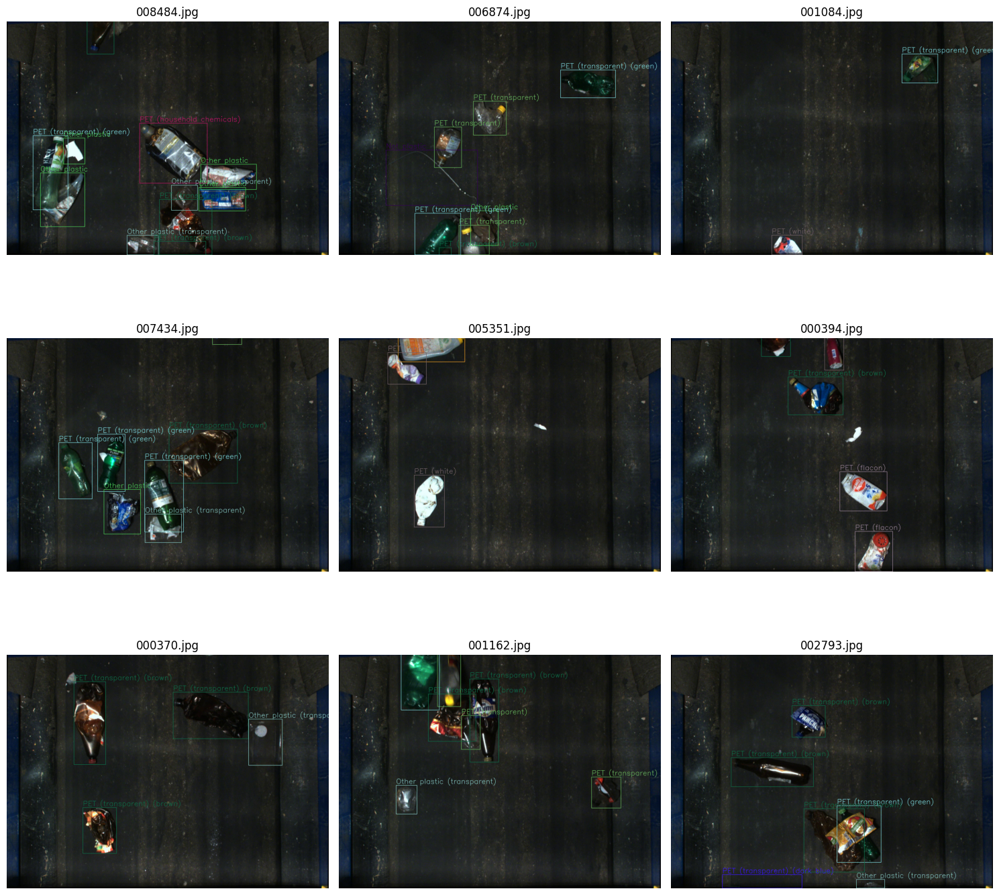

In [ ]:
# Отображение изображений с аннотациями
display_images(
    image_paths=image_paths,
    annotations=annotations,
    grid_size=(3, 3),
    color_map=color_map
)

На изображении `002793.jpg` у нижнего края конвейера обнаружена рамка без объекта. В дальнейшем удалим такие рамки.

### Проверим распределение классов, их пропорции, а также наличие аномалий в данных.

In [ ]:
# Анализ распределения классов
class_counts = train_df['category_id'].value_counts()
class_counts

category_id
2.0     7310
1.0     4747
13.0    4553
4.0     3780
7.0     2530
14.0    2278
10.0    2123
15.0    1032
5.0      909
3.0      848
9.0      653
6.0      495
11.0     374
8.0      364
12.0     152
Name: count, dtype: int64

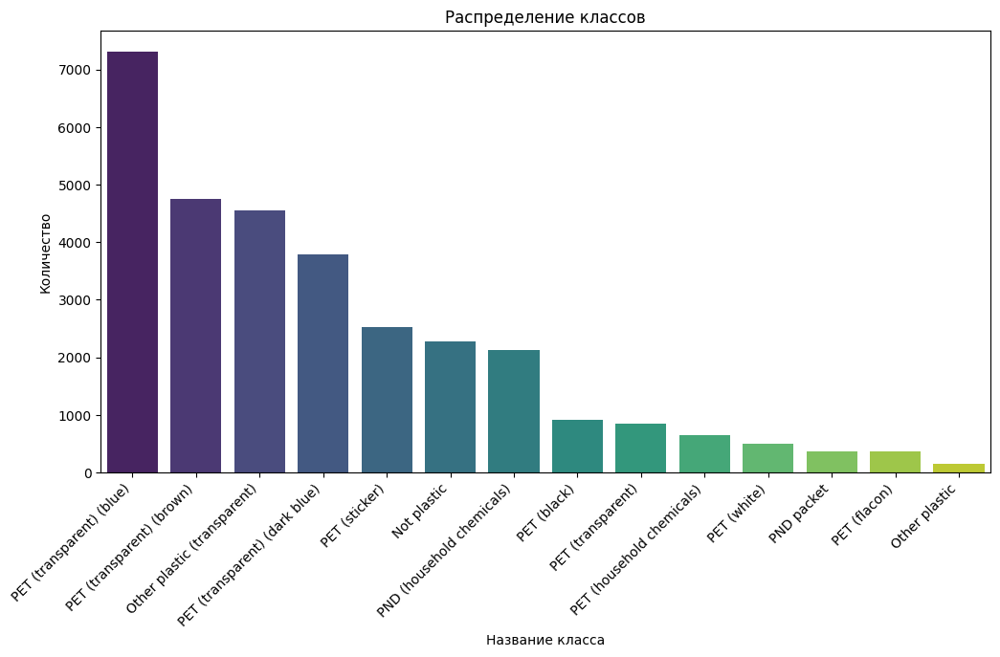

In [ ]:
# Замена индексов на названия классов
class_counts.index = class_counts.index.map(CL_NAMES)

# Построение графика
plt.figure(figsize=(12, 6))
sns.barplot(
    x=class_counts.index,
    y=class_counts.values,
    palette='viridis'
)
plt.title('Распределение классов')
plt.xlabel('Название класса')
plt.ylabel('Количество')
plt.xticks(rotation=45, ha='right')  # Поворот подписей на оси X для улучшения читаемости
plt.show()

Наблюдается сильно выраженный дисбаланс классов

## Предобработка данных



Подготовим данные для использования в модели.

Удалим данные с пустыми bbox возле верхней и нижней границы изображений

In [ ]:
# Открываем изображение и получаем его высоту
image = np.array(Image.open(PATH0 + '/images/000001.jpg'))
img_height = image.shape[0]-1  # Высота изображения

In [ ]:
filtered_train_df = train_df.dropna().copy()

In [ ]:
# Применяем функцию и создаём результирующий столбец
filtered_train_df['is_empty'] = filtered_train_df.apply(
    lambda row: check_bbox(
        row,
        img_height,
        height_threshold=40
    ), axis=1
)

In [ ]:
filtered_train_df.query('is_empty == 1').head()

,file_name,bbox,category_id,is_empty
200,000077.jpg,"[658.0, 0.0, 158.0, 26.0]",7.0,True
257,000094.jpg,"[1515.0, 0.0, 95.0, 31.0]",13.0,True
299,000102.jpg,"[650.0, 1456.0, 154.0, 29.0]",1.0,True
423,000140.jpg,"[885.0, 1446.0, 131.0, 39.0]",9.0,True
441,000143.jpg,"[1054.0, 1447.0, 97.0, 38.0]",14.0,True


In [ ]:
# Разделяем боксы
empty_boxes = filtered_train_df[filtered_train_df['is_empty']].copy()
non_empty_boxes = filtered_train_df[~filtered_train_df['is_empty']].copy()

In [ ]:
# Проверка результатов
print("Количество пустых боксов:", len(empty_boxes))
print("Количество непустых боксов:", len(non_empty_boxes))

Количество пустых боксов: 722
Количество непустых боксов: 31426


Визуализируем пустые боксы

In [ ]:
# Определяем пути к изображениям
image_paths = [
    os.path.join(image_dir, file_name)
    for file_name in random.sample(list(empty_boxes['file_name']), 9)  # Выбираем 9 случайных изображений
]

In [ ]:
# Формируем аннотации
annotations = {}
for _, row in empty_boxes.iterrows():
    file_name = row['file_name']
    bbox = row['bbox']

    # Преобразуем [x, y, w, h] -> [x_min, y_min, x_max, y_max]
    bbox_converted = [
        bbox[0],
        bbox[1],
        bbox[0] + bbox[2],
        bbox[1] + bbox[3]
    ]
    category_id = row['category_id']

    if file_name not in annotations:
        annotations[file_name] = []
    annotations[file_name].append((category_id, bbox_converted))

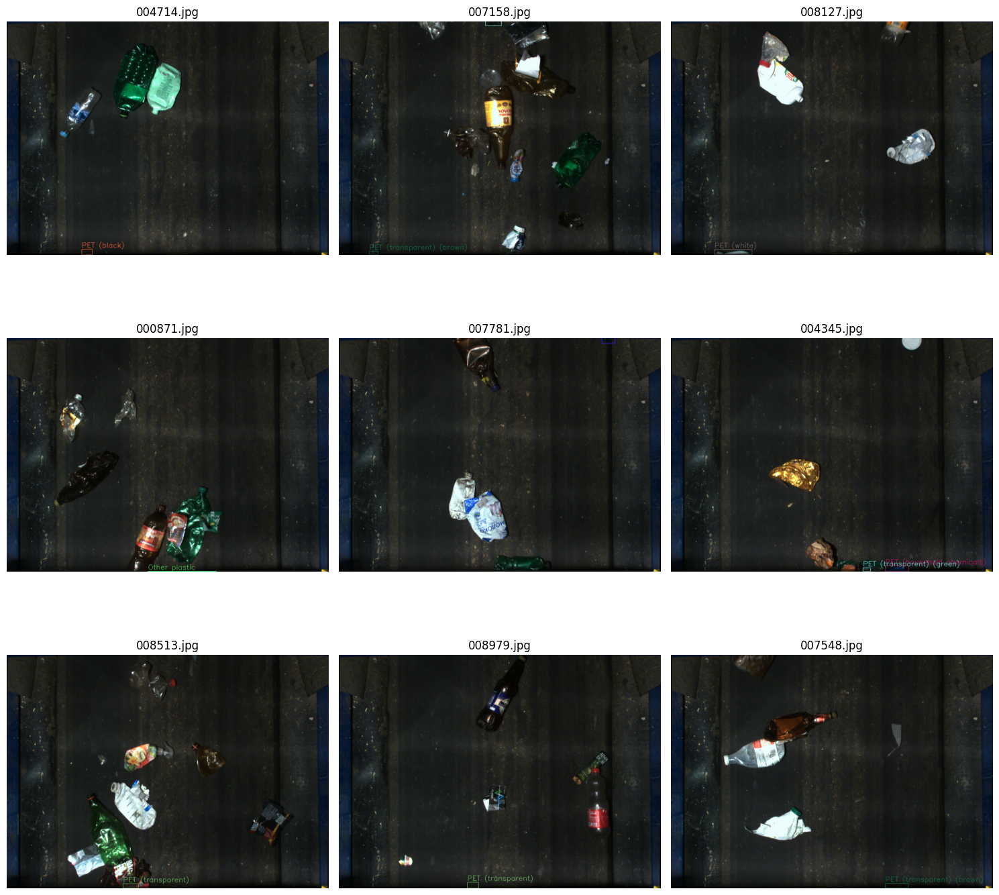

In [ ]:
# Отображение изображений с аннотациями
display_images(
    image_paths=image_paths,
    annotations=annotations,
    grid_size=(3, 3),
    color_map=color_map
)

### Разделение данных на тренировочную и валидационную выборки

In [ ]:
# Разделяем данные
X = non_empty_boxes['file_name']
y = non_empty_boxes['category_id']
groups = non_empty_boxes['file_name']

In [ ]:
# Инициализируем StratifiedGroupKFold
sgkf = StratifiedGroupKFold(n_splits=5, random_state=42, shuffle=True)

In [ ]:
# Стратифицированное разделение данных
# Берем первый фолд
for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    train_files = X.iloc[train_idx]
    val_files = X.iloc[val_idx]
    print(f"Fold {fold}:")
    print(f"  Train: {len(train_files)} файлов")
    print(f"  Validation: {len(val_files)} файлов")
    if fold == 0:  # Используем только первый фолд
        break

Fold 0:
  Train: 25080 файлов
  Validation: 6346 файлов


In [ ]:
# Фильтрация данных для тренировочной и валидационной выборки
train_images = non_empty_boxes[non_empty_boxes['file_name'].isin(train_files)]
val_images = non_empty_boxes[non_empty_boxes['file_name'].isin(val_files)]

# Вывод информации о полученных выборках
print(f"Тренировочная выборка: {len(train_images)} изображений")
print(f"Валидационная выборка: {len(val_images)} изображений")

Тренировочная выборка: 25080 изображений
Валидационная выборка: 6346 изображений


In [ ]:
train_images.head()

,file_name,bbox,category_id,is_empty
0,000001.jpg,"[840.0, 0.0, 176.0, 124.0]",4.0,False
1,000001.jpg,"[612.0, 306.0, 383.0, 397.0]",2.0,False
2,000001.jpg,"[990.92, 551.0, 105.00000000000011, 186.0]",4.0,False
6,000004.jpg,"[1002.0, 728.0, 91.0, 178.0]",4.0,False
7,000004.jpg,"[618.0, 489.0, 377.0, 387.0]",2.0,False


In [ ]:
val_images.head()

,file_name,bbox,category_id,is_empty
3,000002.jpg,"[1000.0, 614.0, 98.0, 178.0]",4.0,False
4,000002.jpg,"[605.0, 358.0, 402.0, 409.0]",2.0,False
5,000002.jpg,"[838.0, 0.0, 164.0, 184.0]",4.0,False
18,000009.jpg,"[1001.0, 1027.0, 104.0, 183.0]",4.0,False
19,000009.jpg,"[744.0, 25.0, 264.0, 540.0]",4.0,False


### Подготовка данных в формате Yolo

In [ ]:
# Применение функции к тренировочным данным
prepare_yolo_format(
    train_images,
    images_folder=os.path.join(PATH, 'yolo_data/train/images'),
    labels_folder=os.path.join(PATH, 'yolo_data/train/labels'),
    images_path=os.path.join(PATH0, 'images')
)

Обработка данных завершена. Файлы сохранены в /kaggle/working/yolo_data/train/images и /kaggle/working/yolo_data/train/labels.


Сравним данные до обработки и после

In [ ]:
# Папка с разметкой
labels_folder = os.path.join(PATH, 'yolo_data/train/labels')

# Получаем список всех .txt файлов в папке
label_files = [file for file in os.listdir(labels_folder) if file.endswith('.txt')]

# Выбираем случайный файл из списка
random_file = random.choice(label_files)

# Путь к выбранному файлу
file_path = os.path.join(labels_folder, random_file)

# Читаем и выводим содержимое файла
with open(file_path, 'r') as file:
    content = file.read()

# Выводим содержимое файла
print(f"Содержимое файла {random_file}:\n")
print(content if content else "(Пустой файл)")

# Получаем имя изображения, заменив расширение .txt на .jpg
image_name = random_file.replace('.txt', '.jpg')

# Получаем данные из train_df для этого изображения
file_data = train_df[train_df['file_name'] == image_name]

# Выводим соответствующие строки из train_df
print(f"\nДанные для изображения {image_name} из train_df:")
display(file_data)

Содержимое файла 000345.txt:

0 0.464111 0.839502 0.190918 0.236205
8 0.416260 0.701211 0.084473 0.176312
0 0.427246 0.464670 0.114258 0.370794
1 0.397705 0.143674 0.108887 0.287349

Данные для изображения 000345.jpg из train_df:


,file_name,bbox,category_id
1014,000345.jpg,"[755.0, 1072.0, 391.0, 351.0]",1.0
1015,000345.jpg,"[766.0, 911.0, 173.0, 262.0]",9.0
1016,000345.jpg,"[758.0, 415.0, 234.0, 551.0]",1.0
1017,000345.jpg,"[703.0, 0.0, 223.0, 427.0]",2.0


Проверим отображение рамок bbox на изображениях

In [ ]:
# Список всех изображений в папке
image_files = [f for f in os.listdir(PATH + 'yolo_data/train/images') if f.endswith('.jpg')]

# Преобразуем аннотации YOLO в формат для отображения
yolo_annotations = yolo_to_annotations(
    labels_folder=PATH + 'yolo_data/train/labels',
    images_folder=PATH + 'yolo_data/train/images',
    image_names=image_files,
)

# Случайно выбираем изображения для отображения
np.random.seed(RANDOM_STATE)
np.random.shuffle(image_files)
selected_images = image_files[:9]  # Берём 9 изображений для отображения

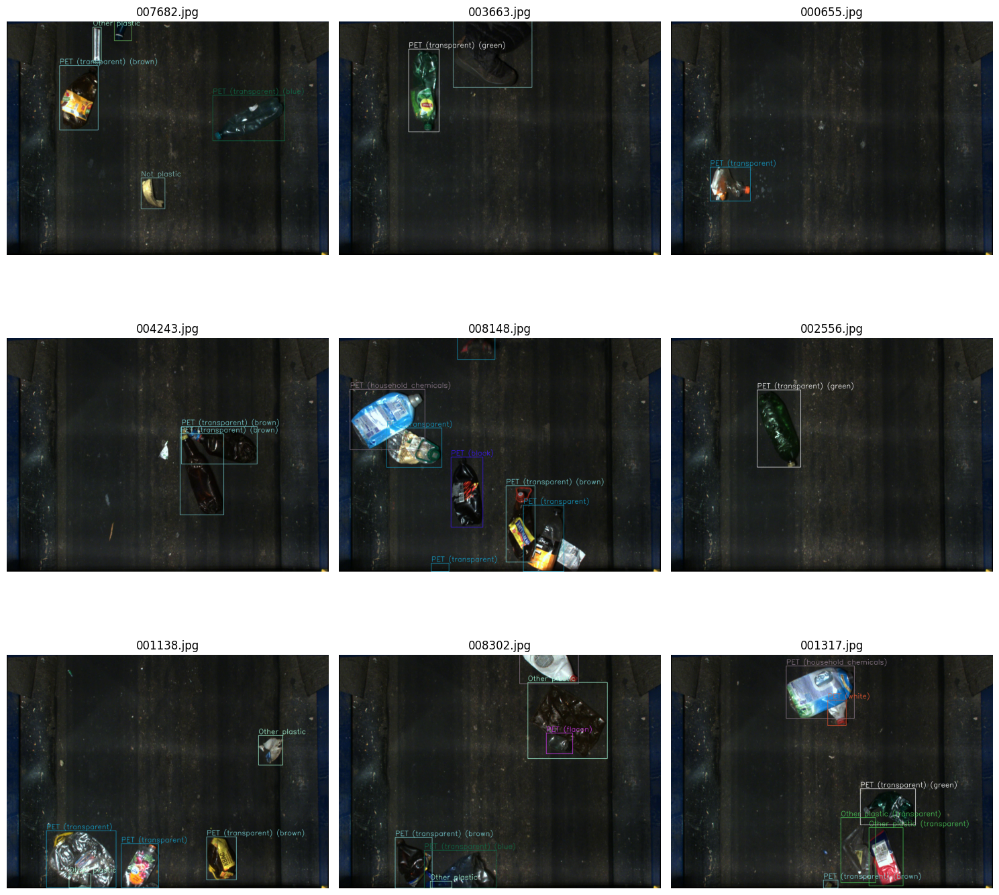

In [ ]:
# Отображаем изображения с аннотациями
display_images(
    image_paths=[os.path.join(PATH + 'yolo_data/train/images', img) for img in selected_images],
    annotations=yolo_annotations,
    grid_size=(3, 3),
    color_map=color_map,
    cli=0
)

In [ ]:
prepare_yolo_format(
    val_images,
    images_folder = PATH + 'yolo_data/val/images',
    labels_folder = PATH + 'yolo_data/val/labels',
    images_path = PATH0 + 'images/'
)

Обработка данных завершена. Файлы сохранены в /kaggle/working/yolo_data/val/images и /kaggle/working/yolo_data/val/labels.


Подключим ClearML

In [ ]:
%env CLEARML_WEB_HOST=https://app.clear.ml/
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=ACCESS_KEY
%env CLEARML_API_SECRET_KEY=SECRET_KEY

In [ ]:
task = Task.init(project_name="Waste_Detection", task_name="Yolo11m")

ClearML Task: created new task id=40489cc01a4e4f3497d2ac9955f65652
2024-12-24 17:00:23,889 - clearml.Repository Detection - WARNING - Failed accessing the jupyter server(s): []
2024-12-24 17:00:23,915 - clearml.Task - INFO - No repository found, storing script code instead
ClearML results page: https://app.clear.ml/projects/09e0f466ae4d421d896ad485895df138/experiments/40489cc01a4e4f3497d2ac9955f65652/output/log


/opt/conda/lib/python3.10/site-packages/clearml/utilities/process/mp.py:633: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



Ранее были обучены модели `YOLO11n` и `YOLO11m` с предобученными весами.


**Результаты:**  

---
**Тренировочная выборка**

| **Модель**   | **Гиперпараметры**                                                                                  | **P**   | **R**   | **mAP@50** | **mAP@50-95** |
|--------------|-----------------------------------------------------------------------------------------------------|---------|---------|-------------|---------------|
| **YOLO11n**  | AdamW (lr=0.002→0.1, momentum=0.95), изображения: 864 px, батч: 128, аугментация                     | 0.978   | 0.908   | 0.952       | 0.857         |
| **YOLO11m**  | AdamW, изображения: 1024 px, батч: 16, AugMix, HSV преобразования, ранняя остановка (patience=15)   | 0.989       | 0.929       | 0.962       | 0.891         |

---

**Валидационная выборка**

| **Модель**   | **Гиперпараметры**                                                                                  | **P**   | **R**   | **mAP@50** | **mAP@50-95** |
|--------------|-----------------------------------------------------------------------------------------------------|---------|---------|-------------|---------------|
| **YOLO11n**  | AdamW (lr=0.002→0.1, momentum=0.95), изображения: 864 px, батч: 128, аугментация                     | 0.975   | 0.907   | 0.953       | 0.854         |
| **YOLO11m**  | AdamW, изображения: 1024 px, батч: 16, AugMix, HSV преобразования, ранняя остановка (patience=15)   | 0.989       | 0.923       | 0.960       | 0.892         |

---

**Тестовая выборка**

| **Модель**   | **Средневзвешенная точность** |
|--------------|-----------------------------------------|
| **YOLO11n** | [0.84379 (Private)]('https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.84991 (Public) ]('https://www.kaggle.com/competitions/waste-detection/leaderboard)                              |
| **YOLO11m**  | [0.84379 (Private)](https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.84991 (Public)](https://www.kaggle.com/competitions/waste-detection/leaderboard)|

---

Модели показывают высокую точность (P), полноту (R), **mAP**, что подтверждает их хорошее качество, но попробуем их улучшить. Для этого используем модель `YOLO11m`, и изображения размером 1024 пикселя, без пустой разметки возле верхнего и нижнего краёв.

Загрузим модель

In [ ]:
model = YOLO("yolo11m.pt")

100%|██████████| 38.8M/38.8M [00:01<00:00, 26.7MB/s]


2024-12-24 17:00:32,387 - clearml.model - INFO - Selected model id: 723055d474fe44c595dacc3e507ecdb2


In [ ]:
train_image_dir = PATH + 'yolo_data/train/images'
train_label_dir = PATH + 'yolo_data/train/labels'
val_image_dir = PATH + 'yolo_data/val/images'
val_label_dir = PATH + 'yolo_data/val/labels'

In [ ]:
# Создаем конфигурационный файл для обучения
training_config = {
    "train": [train_image_dir, train_label_dir],
    "val": [val_image_dir, val_label_dir],
    "nc": len(CL_NAMES),  # Количество классов
    "names": CL_NAMES,  # Имена классов
}

In [ ]:
# Сохраняем конфигурацию в файл
with open("data.yaml", "w") as f:
    yaml.dump(training_config, f)

In [ ]:
# Параметры для обучения
training_params = {
    "epochs": 150,                # Количество эпох, за которые модель будет проходить полный набор данных для обучения
    "patience": 15,               # Количество эпох без улучшения метрики до остановки обучения (ранняя остановка)
    "batch": 18,                  # Размер батча, определяющий количество изображений, обрабатываемых за одну итерацию
    "imgsz": 1024,                # Размер изображений (ширина и высота), до которых будут приводиться все изображения
    "auto_augment": "augmix",     # Стратегия автоматического увеличения данных для улучшения обучения ("augmix" использует комбинирование различных аугментаций)
    "seed": RANDOM_STATE,         # Значение для инициализации генератора случайных чисел (обеспечивает воспроизводимость результатов)
    "hsv_s": 0.5,                 # Значение насыщенности для цветового преобразования в HSV-пространстве (используется для увеличения данных)
    "project": "waste_detection", # Папка для сохранения результатов
    "name": "yolo11",             # Имя эксперимента
    "device": device,             # Использование GPU или CPU
}

In [ ]:
# Путь к файлу данных
data_config = "data.yaml"  # Путь к файлу с конфигурацией данных

In [ ]:
results = model.train(data=data_config, **training_params)

**Итоги обучения модели**

**Общая информация об обучении:**
- **Параметры GPU:** Память — 12.3G.
- **Эпохи:** 129 из 150.
- **Средние значения потерь:**  
  - Box Loss: 0.3487  
  - Class Loss: 0.2136  
  - DFL Loss: 0.8643  
- **Размер входного изображения:** 1024x1024.  
- **Количество инстансов в батче:** 47.  

**Метрики:**
- **Точность (P):** 0.991  
- **Полнота (R):** 0.945  
- **mAP50:** 0.975  
- **mAP50-95:** 0.909  

**Ресурсы:**
- **Количество слоёв модели:** 303  
- **Количество параметров:** 20,041,597  
- **GFLOPs:** 67.7  
- **Общее время обучения:** 9.7 часов.  

---

**Результаты по классам:**

| **Класс**                               | **Инстансы** | **P**   | **R**   | **mAP50** | **mAP50-95** |
|-----------------------------------------|--------------|---------|---------|-----------|--------------|
| **Все классы**                          | 6,346        | 0.984   | 0.949   | 0.976     | 0.910        |
| PET (transparent) (green)               | 907          | 0.985   | 0.961   | 0.980     | 0.917        |
| PET (transparent) (brown)               | 1,421        | 0.986   | 0.955   | 0.981     | 0.917        |
| PET (transparent) (blue)                | 167          | 0.967   | 0.952   | 0.974     | 0.906        |
| PET (transparent)                       | 727          | 0.978   | 0.920   | 0.964     | 0.889        |
| PET (transparent) (dark blue)           | 181          | 0.988   | 0.945   | 0.972     | 0.907        |
| PET (black)                             | 95           | 0.969   | 0.968   | 0.990     | 0.930        |
| PET (white)                             | 517          | 0.984   | 0.957   | 0.980     | 0.928        |
| PET (sticker)                           | 66           | 1.000   | 0.932   | 0.954     | 0.863        |
| PET (flacon)                            | 116          | 0.991   | 0.910   | 0.967     | 0.916        |
| PET (household chemicals)               | 470          | 0.993   | 0.940   | 0.976     | 0.925        |
| PND (household chemicals)               | 78           | 0.974   | 0.971   | 0.979     | 0.879        |
| PND packet                              | 29           | 0.984   | 0.966   | 0.992     | 0.929        |
| Other plastic                           | 945          | 0.996   | 0.944   | 0.975     | 0.918        |
| Other plastic (transparent)             | 424          | 0.982   | 0.955   | 0.979     | 0.927        |
| Not plastic                             | 203          | 0.988   | 0.956   | 0.975     | 0.894        |

---

**Скорость работы:**
- **Предобработка:** 0.3 мс на изображение.  
- **Инференс:** 20.1 мс на изображение.  
- **Постобработка:** 1.1 мс на изображение.  

## Показатели работы модели

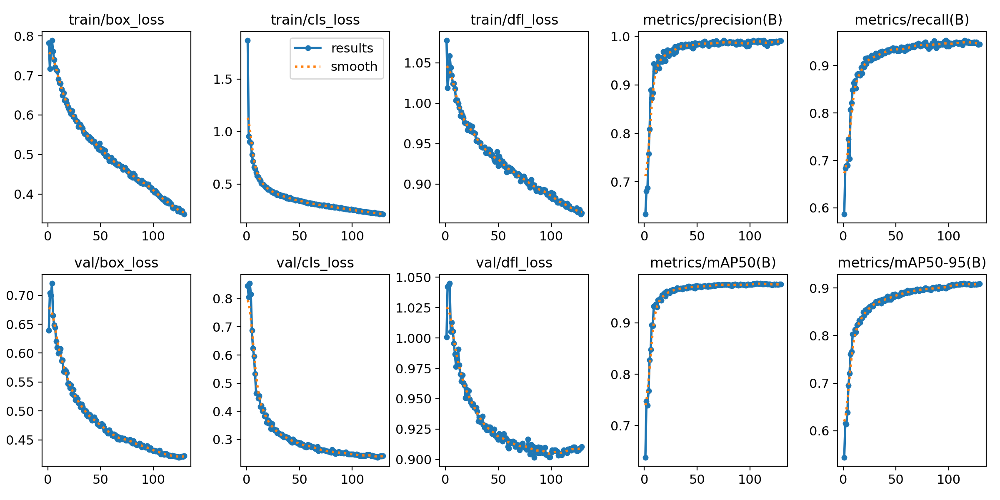

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/results.png')))

Функции потерь стабильно уменьшаются как на обучающих данных, так и на валидации, что свидетельствует о корректной настройке модели и её способности хорошо обучаться.

Метрика mAP стремительно достигает высокого уровня (выше 0.8) примерно к 20-й эпохе, после чего её рост замедляется, стабилизируясь к 40-й эпохе. Это указывает на то, что модель быстро обучается и сохраняет свою эффективность до конца обучения.

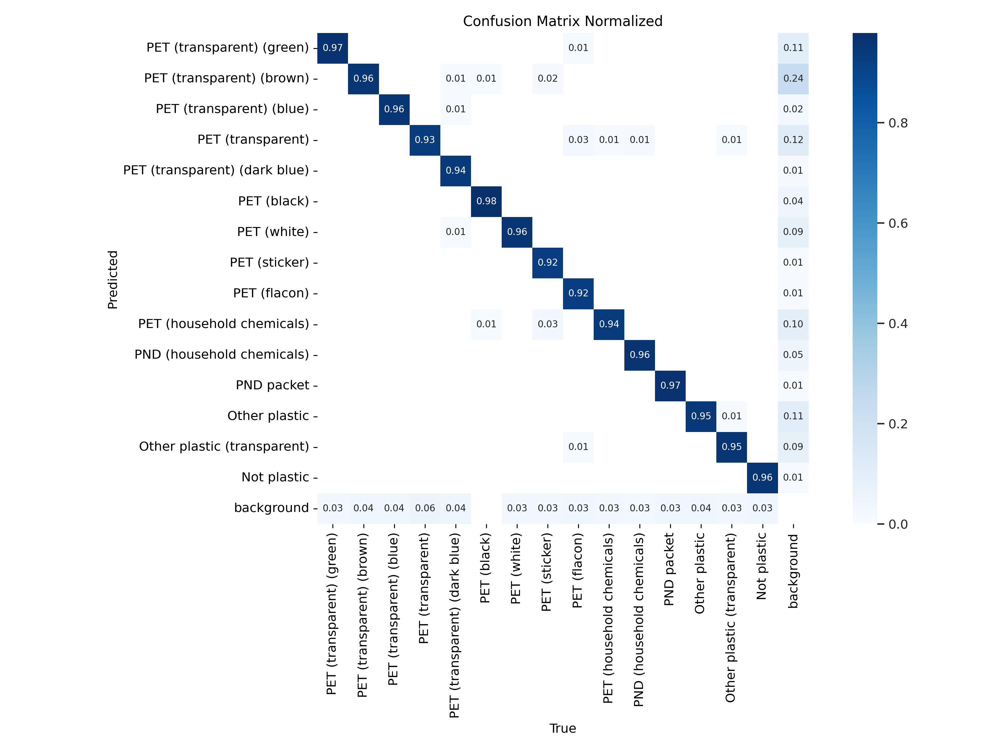

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/confusion_matrix_normalized.png')))

Модель правильно распознаёт классы в более 92% случаев:

* PET (transparent) (green): 97%
* PET (transparent) (brown): 96%
* PET (transparent) (blue): 96%
* PET (transparent): 93%
* PET (transparent) (dark blue): 94%
* PET (black): 98%
* PET (white): 96%
* PET (sticker): 92%
* PET (flacon): 92%
* PET (household chemicals): 94%
* PND (household chemicals): 96%
* PND packet: 97%
* Other plastic: 95%
* Other plastic (transparent) : 95%
* Not plastic: 96%

Ошибки чаще всего возникают из-за ложной детекции объектов на пустом фоне. Вероятной причиной этого являются некорректно размеченные файлы, в которых объекты указаны на верхнем и нижнем краях изображения, хотя в действительности они отсутствуют.

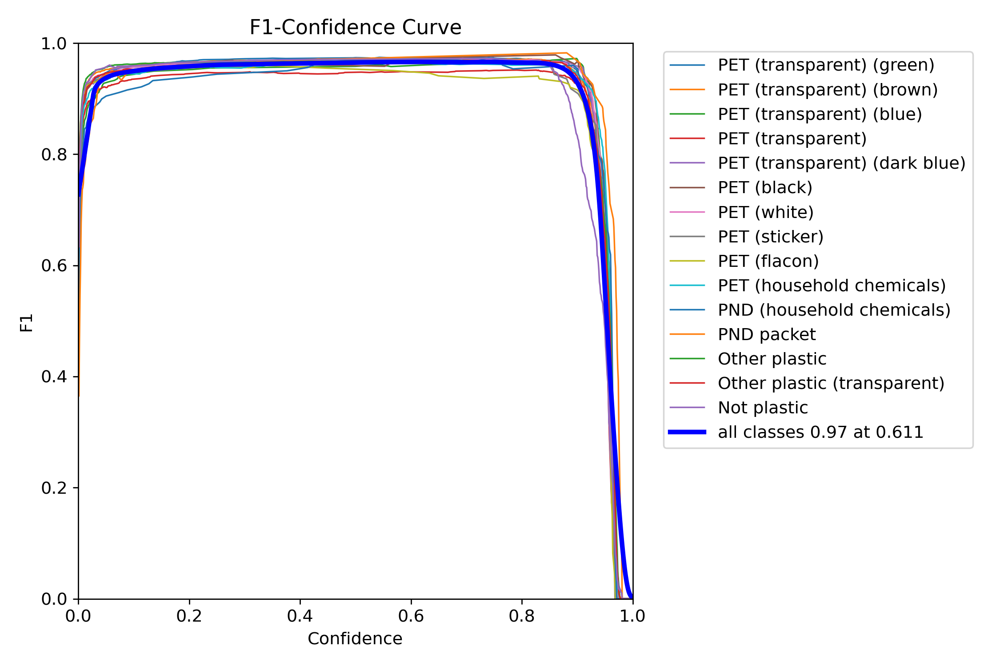

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/F1_curve.png')))

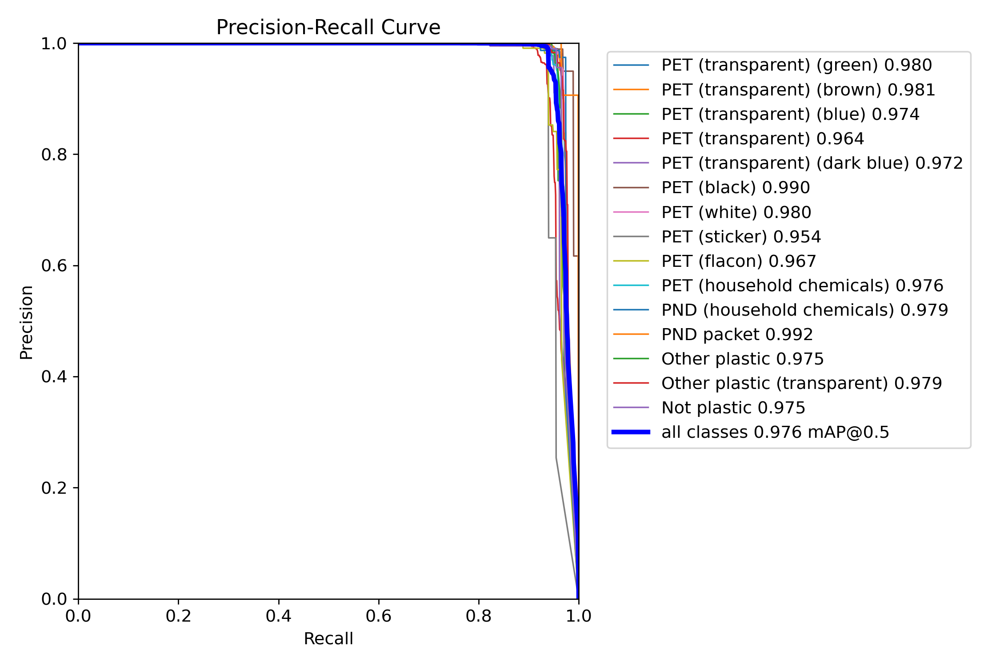

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/PR_curve.png')))

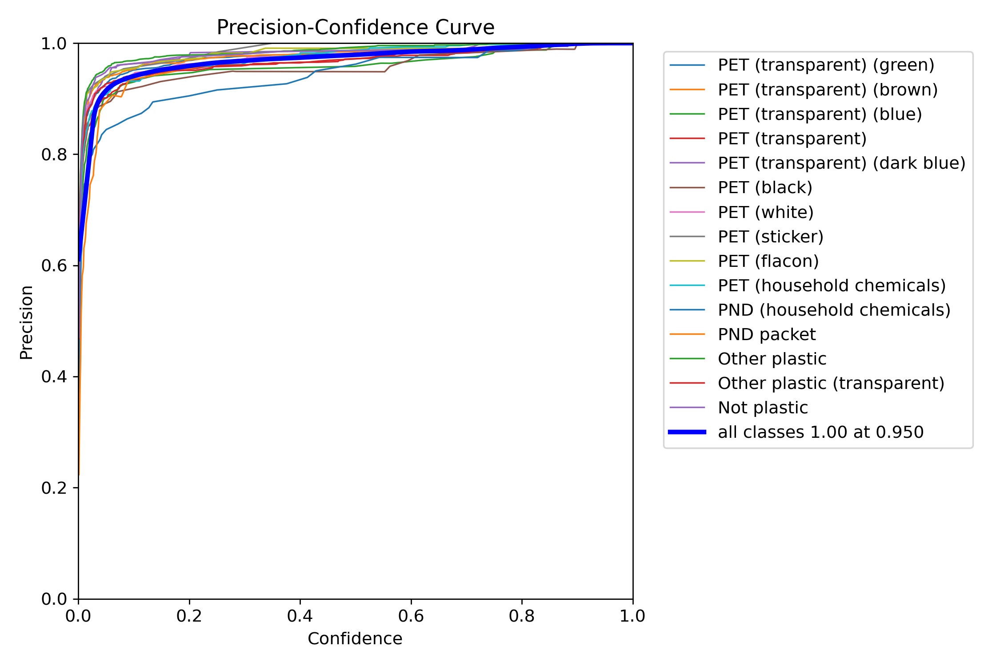

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/P_curve.png')))

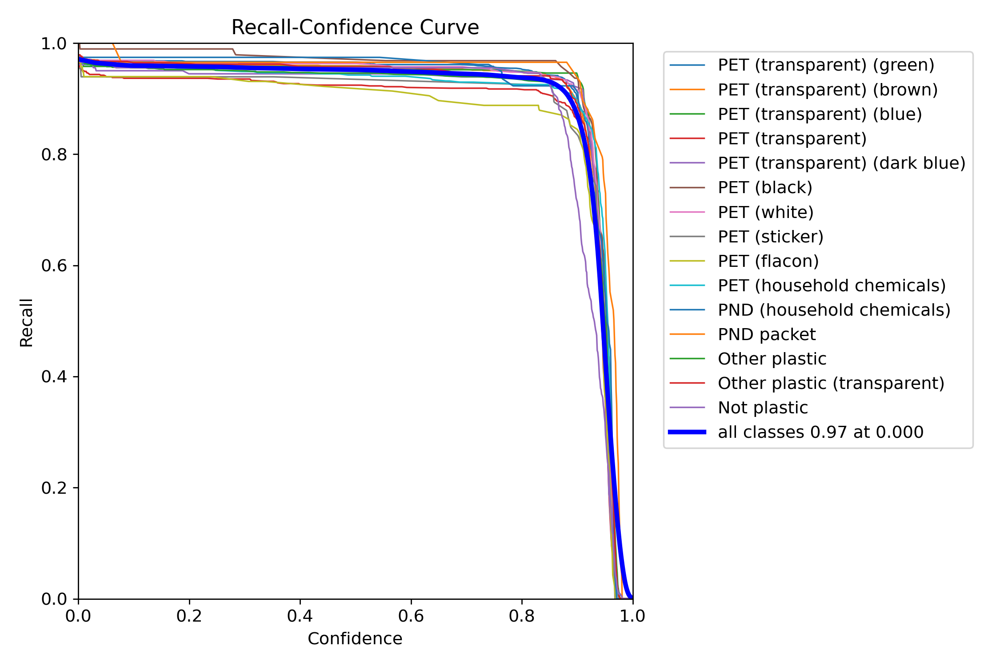

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/R_curve.png')))

Модель демонстрирует отличные результаты по ключевым метрикам: точности, полноте и стабильности классификации для всех классов. Это говорит о том, что модель эффективно обучилась на данном наборе данных и уверенно справляется с задачами классификации и детекции пластиковых отходов.

Отобразим пример детекции объектов моделью на тренировочной выборке

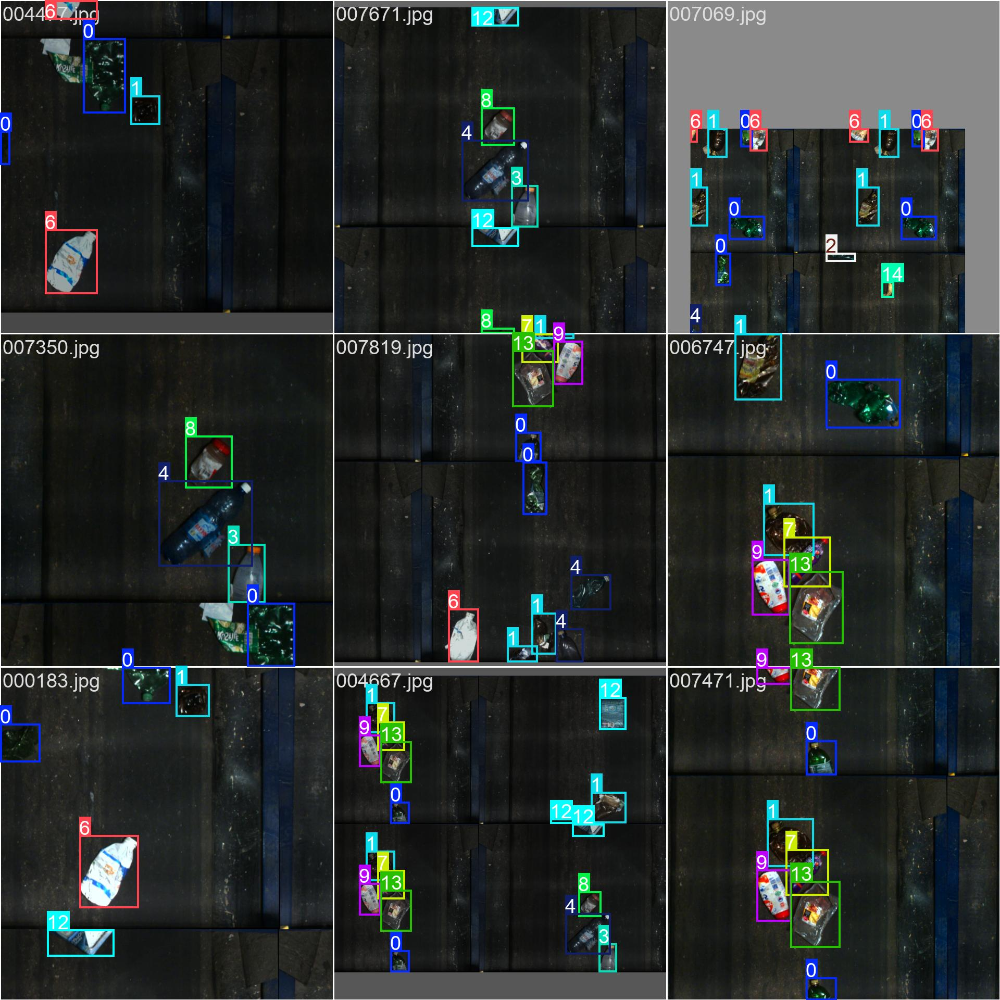

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/train_batch1.jpg')))

Отобразим пример детекции объектов моделью на валидационной выборке

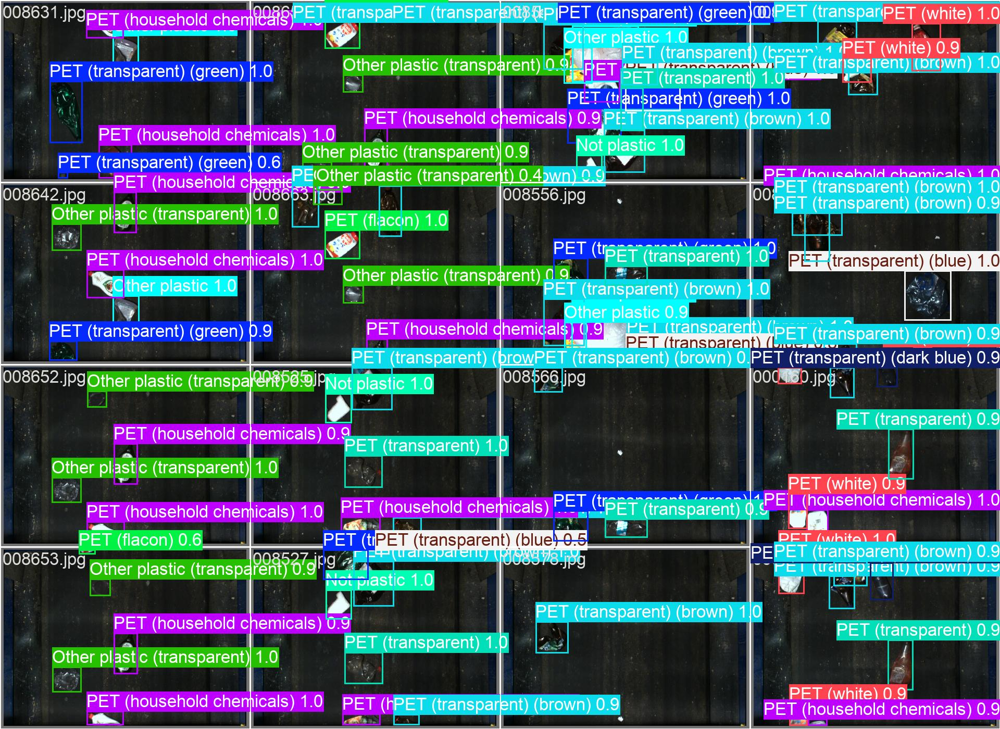

In [ ]:
display(IPImage(filename=(PATH + 'yolo11/val_batch1_pred.jpg')))

На данных примерах все объекты верно детектированы и распознаны моделью

# Получим предсказания на тестовой выборке

In [ ]:
# Список путей к изображениям тестового набора
test_image_paths = [os.path.join(image_dir, file_name) for file_name in test_df['file_name']]

In [ ]:
# Результирующий словарь
formatted_predictions = defaultdict(list)

In [ ]:
for image_path in test_image_paths:
    results = model(image_path)
    for result in results:
        for box in result.boxes:
            x_min, y_min, x_max, y_max = box.xyxy[0].tolist()
            confidence = box.conf[0].item()
            category_id = int(box.cls[0].item())  # Класс объекта +1
            width = x_max - x_min
            height = y_max - y_min

            file_name = os.path.basename(image_path)
            formatted_predictions[file_name].append([
                float(category_id)+1,  # Класс объекта
                round(confidence, 2),  # Уверенность
                round(x_min, 2),  # x_left
                round(y_min, 2),  # y_top
                round(width, 2),  # width
                round(height, 2)  # height
            ])

In [ ]:
# Создание списка для DataFrame
submission_data = []

In [ ]:
for file_name, objects in formatted_predictions.items():
    # Преобразуем список объектов в строку
    objects_str = str(objects)
    submission_data.append({'file_name': file_name, 'predictions': objects_str})

In [ ]:
# Преобразуем в DataFrame
submission_df = pd.DataFrame(submission_data)

In [ ]:
# Убедимся, что все изображения из тестового набора включены, даже если предсказания пустые
all_files = set(test_df['file_name'])
predicted_files = set(submission_df['file_name'])
missing_files = all_files - predicted_files

In [ ]:
for file_name in missing_files:
    submission_df = pd.concat([submission_df, pd.DataFrame([{'file_name': file_name, 'predictions': '[]'}])])

In [ ]:
# Сортируем строки по file_name, чтобы сохранить порядок
submission_df = submission_df.sort_values(by='file_name').reset_index(drop=True)

In [ ]:
# Сохраняем в CSV
submission_df.to_csv('submission.csv', index=False)
print("Файл submission.csv успешно создан!")

Файл submission.csv успешно создан!


In [ ]:
# Проверяем первые строки файла
submission_sample = pd.read_csv('submission.csv')
print(submission_sample.head())

    file_name                                        predictions
0  000003.jpg  [[2.0, 0.96, 615.33, 428.61, 378.12, 388.22], ...
1  000006.jpg  [[2.0, 0.97, 617.18, 604.18, 376.43, 391.95], ...
2  000013.jpg  [[2.0, 0.96, 618.13, 1024.8, 376.36, 392.73], ...
3  000016.jpg  [[2.0, 0.95, 616.42, 1198.88, 344.87, 286.09],...
4  000019.jpg  [[10.0, 0.95, 727.67, 942.65, 176.29, 287.92],...


## Вывод

В рамках проекта по автоматическому обнаружению пластикового мусора были разработаны и обучены две модели семейства **YOLOv11**: базовая **YOLO11n** и улучшенная **YOLO11m**. Цель заключалась в повышении точности классификации и распознавания объектов, а также в улучшении ключевых метрик на тестовой выборке.

---

### Этапы выполнения:

1. **Подготовка данных:**  
   - Использованы размеченные изображения, включающие классы пластикового мусора.  
   - Для предотвращения переобучения и оценки модели на независимых данных использовалась валидационная выборка.  

2. **Обучение базовой модели — YOLO11n:**  
   - **Гиперпараметры:**  
     - Предобученные веса.  
     - Оптимизатор: AdamW (lr=0.002→0.1, momentum=0.95).  
     - Размер изображений: 864 пикселя, батч: 128.  
     - Разнообразие данных достигнуто с помощью аугментации.  
   - **Результаты:**  
     - **Валидационная выборка:**  
       - **Precision (P):** 0.975  
       - **Recall (R):** 0.907  
       - **mAP@50:** 0.953  
       - **mAP@50-95:** 0.854  
     - **Тестовая выборка:**
       - Средневзвешенная точность: [0.84379 (Private)](https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.84991 (Public)](https://www.kaggle.com/competitions/waste-detection/leaderboard).  

3. **Обучение улучшенной модели — YOLO11m:**  
   - **Гиперпараметры:**  
     - Предобученные веса.  
     - Оптимизатор: AdamW.  
     - Размер изображений: 1024 пикселя, батч: 16.  
     - Аугментация **AugMix**, преобразование HSV.  
     - Ранняя остановка (patience=15).  
   - **Результаты:**  
     - Обучение завершено досрочно за 129 эпох.  
     - **Валидационная выборка:**  
       - **Precision (P):** 0.989  
       - **Recall (R):** 0.923  
       - **mAP@50:** 0.96  
       - **mAP@50-95:** 0.892      
     - **Тестовая выборка:**  
      - Средневзвешенная точность: [0.87161 (Private)](https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.87995 (Public)](https://www.kaggle.com/competitions/waste-detection/leaderboard).  
4. **Обучение улучшенной модели — YOLO11m (очищенный датасет):**  
   - **Гиперпараметры:**  
     - Предобученные веса.  
     - Оптимизатор: AdamW.  
     - Размер изображений: 1024 пикселя, батч: 16.  
     - Аугментация **AugMix**, преобразование HSV.  
     - Ранняя остановка (patience=15).  
   - **Результаты:**  
     - Обучение завершено досрочно за 129 эпох.  
     - **Валидационная выборка:**  
       - **Precision (P):** 0.991  
       - **Recall (R):** 0.945  
       - **mAP@50:** 0.975  
       - **mAP@50-95:** 0.909  
     - **Тестовая выборка:**  
      - Средневзвешенная точность: [0.86688 (Private)](https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.87630 (Public)](https://www.kaggle.com/competitions/waste-detection/leaderboard).  
     - **Поклассовые метрики YOLO11m:**  
      - Наиболее точное распознавание: PET (чёрный, белый, бытовая химия).  
      - Наименее точное: PET (наклейки) и PND (бытовая химия), что указывает на возможность дальнейшего улучшения качества распознавания для этих классов.  

---

### Выводы:  
1. **YOLO11n** продемонстрировала высокие показатели точности и полноты, однако дальнейшее улучшение стало возможным благодаря внедрению более мощной модели **YOLO11m**, увеличенному разрешению изображений и усовершенствованным настройкам.  
2. **YOLO11m** превзошла **YOLO11n**, улучшив метрики на 3–4% за счёт большей архитектурной сложности, увеличенного размера входных изображений и применения расширенных методов аугментации.  
3. Оценка качества на тестовой выборке подтвердила, что оптимизация гиперпараметров, увеличение разрешения изображений и изменения в архитектуре значительно повышают производительность модели. Модель демонстрирует устойчивость и высокую точность при распознавании большинства классов пластикового мусора.  
4. Исключение пустых рамок на верхних и нижних границах изображений в тренировочном датасете улучшило метрики на валидационной выборке, но привело к снижению качества на тестовой выборке. Вероятно, это связано с наличием подобных рамок на изображениях тестовой выборки, которые отсутствовали в тренировочном датасете.  

---

### Рекомендации:  
Для дальнейшего улучшения качества модели рекомендуется:  
- Увеличить объём тренировочных данных.  
- Исследовать дополнительные методы аугментации.  
- Рассмотреть использование альтернативных архитектур моделей и автоподбор гиперпараметров.  

---

**Итог:** Проект успешно продемонстрировал возможности применения методов глубокого обучения для автоматического обнаружения пластикового мусора различных классов. Разработанная модель обладает потенциалом для дальнейшего улучшения и адаптации к условиям реального применения.
